In [1]:
# Función que nos permite definir la relación de color con base en el minimo 
# y el maximo de un conjunto de datos y una paleta de color elegida
def colors_from_values(values, palette_name):
    # normalize the values to range [0, 1]
    normalized = (values - min(values)) / (max(values) - min(values))
    # convert to indices
    indices = np.round(normalized * (len(values) - 1)).astype(np.int32)
    # use the indices to get the colors
    palette = sns.color_palette(palette_name, len(values))
    return np.array(palette).take(indices, axis=0)

# 1. Importamos los paquetes necesarios para el análisis

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from sklearn.metrics import mean_absolute_error

import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
sns.set()

from sklearn.preprocessing import StandardScaler

In [88]:
import gc
from datetime import datetime 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
# from catboost import CatBoostClassifier
from sklearn import svm
import lightgbm as lgb
from lightgbm import LGBMClassifier
import xgboost as xgb
from sklearn.metrics import roc_curve, auc

# 2. Cargamos el dataset base compartido

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
path = '/content/drive/MyDrive/Colab Notebooks/Test_Davivienda/Base_Classification_test.csv'

In [5]:
df = pd.read_csv(path, sep=',')

In [6]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


# 3. Evaluamos la información general del dataset base

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [8]:
len(df.columns)

29

In [9]:
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [10]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [12]:
cols_org_Costumer_info = ['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome','Teenhome']
cols_org_date= ['Dt_Customer','Recency']
cols_org_Mnt = ['MntFishProducts','MntFruits', 'MntMeatProducts', 'MntSweetProducts','MntWines','MntGoldProds']
cols_org_Num = ['NumCatalogPurchases','NumDealsPurchases', 'NumStorePurchases', 'NumWebPurchases',  'NumWebVisitsMonth']
cols_org_Acc = ['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']
cols_org_Others = ['Complain', 'Z_CostContact', 'Z_Revenue']
cols_org_Target = ['Response']

### ---> Información especifica del cliente

In [13]:
df[cols_org_Costumer_info]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome
0,5524,1957,Graduation,Single,58138.0,0,0
1,2174,1954,Graduation,Single,46344.0,1,1
2,4141,1965,Graduation,Together,71613.0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0
4,5324,1981,PhD,Married,58293.0,1,0
...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1
2236,4001,1946,PhD,Together,64014.0,2,1
2237,7270,1981,Graduation,Divorced,56981.0,0,0
2238,8235,1956,Master,Together,69245.0,0,1


##### ---> Variable ID:

In [14]:
len(df.ID.unique())

2240

##### ---> Variable Year_Birth:

In [15]:
print(sorted(df.Year_Birth.unique()))

[1893, 1899, 1900, 1940, 1941, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996]


In [ ]:
df.Year_Birth.value_counts(sort=False)

1900     1
1940     1
1944     7
1946    16
1948    21
1950    29
1952    52
1954    50
1956    55
1958    53
1960    49
1962    44
1964    42
1966    50
1968    51
1970    77
1972    79
1974    69
1976    89
1978    77
1980    39
1982    45
1984    38
1986    42
1988    29
1990    18
1992    13
1994     3
1996     2
1893     1
1899     1
1941     1
1943     7
1945     8
1947    16
1949    30
1951    43
1953    35
1955    49
1957    43
1959    51
1961    36
1963    45
1965    74
1967    44
1969    71
1971    87
1973    74
1975    83
1977    52
1979    53
1981    39
1983    42
1985    32
1987    27
1989    30
1991    15
1993     5
1995     5
Name: Year_Birth, dtype: int64

In [16]:
df['Age']=df.Year_Birth.apply(lambda x: 2021-x)

In [17]:
# Generamos los intervalos y las categorias en los que queremos etiquetar las mediciones
bins = pd.IntervalIndex.from_tuples([(0, 30), (30, 35), (35, 40), (40, 45), (45, 50), (50, 55),(55, 60),(60, 65),(65, 70), (70, 75),(75, 140)], closed='left')
categorias = [' < 30', '30 - 35', '35 - 40', '40 - 45', '45 - 50', '50 - 55', '55 - 60', '60 - 65', '65 - 70', '70 - 75', '75 >']
print(bins)
print(categorias)

IntervalIndex([[0, 30), [30, 35), [35, 40), [40, 45), [45, 50) ... [55, 60), [60, 65), [65, 70), [70, 75), [75, 140)],
              closed='left',
              dtype='interval[int64]')
[' < 30', '30 - 35', '35 - 40', '40 - 45', '45 - 50', '50 - 55', '55 - 60', '60 - 65', '65 - 70', '70 - 75', '75 >']


In [18]:
# Se muestra a manera de ejemplo como se haría la etiqueta de una columna en especifico
pd.Series(np.array(categorias)[pd.cut(df["Age"], bins = bins).cat.codes], index=df.index)

0       60 - 65
1       65 - 70
2       55 - 60
3       35 - 40
4       40 - 45
         ...   
2235    50 - 55
2236       75 >
2237    40 - 45
2238    65 - 70
2239    65 - 70
Length: 2240, dtype: object

In [19]:
df['Age_range']=pd.Series(np.array(categorias)[pd.cut(df["Age"], bins = bins).cat.codes], index=df.index)

In [20]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70


##### ---> Variable Education:

In [21]:
df.Education.unique()

array(['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'], dtype=object)

In [22]:
df['Edu_encode']= df.Education.copy()

In [23]:
df.Edu_encode.replace({'Basic': 0, 'Graduation': 1, '2n Cycle': 2, 'Master': 3, 'PhD': 4}, inplace=True)

In [24]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >,4
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70,3


##### ---> Variable Marital_Status:

In [25]:
df.Marital_Status.unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [26]:
df.Marital_Status.value_counts()

Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
YOLO          2
Absurd        2
Name: Marital_Status, dtype: int64

In [27]:
indx_drop = df[df.Marital_Status.isin(['Alone', 'Absurd', 'YOLO'])].index
df.drop(indx_drop, inplace=True)

In [28]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >,4
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70,3


In [29]:
df_encode_pandas = pd.get_dummies(df, columns=['Marital_Status','Kidhome', 'Teenhome' ])

In [30]:
df_encode_pandas

,ID,Year_Birth,Education,Income,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Kidhome_0,Kidhome_1,Kidhome_2,Teenhome_0,Teenhome_1,Teenhome_2
0,5524,1957,Graduation,58138.0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65,1,0,0,1,0,0,1,0,0,1,0,0
1,2174,1954,Graduation,46344.0,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70,1,0,0,1,0,0,0,1,0,0,1,0
2,4141,1965,Graduation,71613.0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60,1,0,0,0,1,0,1,0,0,1,0,0
3,6182,1984,Graduation,26646.0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40,1,0,0,0,1,0,0,1,0,1,0,0
4,5324,1981,PhD,58293.0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45,4,0,1,0,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,61223.0,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55,1,0,1,0,0,0,1,0,0,0,1,0
2236,4001,1946,PhD,64014.0,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >,4,0,0,0,1,0,0,0,1,0,1,0
2237,7270,1981,Graduation,56981.0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45,1,1,0,0,0,0,1,0,0,1,0,0
2238,8235,1956,Master,69245.0,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70,3,0,0,0,1,0,1,0,0,0,1,0


In [32]:
def get_scaler_standar(df,columns):
    df_scaled=df.copy()
    std_scaler = StandardScaler()
    array_scaled=std_scaler.fit_transform(df[columns])
    df_scaled_columns = pd.DataFrame(data=array_scaled, columns=df[columns].columns, index=df[columns].index)
    df_scaled[columns]=df_scaled_columns
    return df_scaled

In [33]:
get_scaler_standar(df,['Income'])

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode
0,5524,1957,Graduation,Single,0.233957,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65,1
1,2174,1954,Graduation,Single,-0.234193,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70,1
2,4141,1965,Graduation,Together,0.768833,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60,1
3,6182,1984,Graduation,Together,-1.016084,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40,1
4,5324,1981,PhD,Married,0.240109,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,0.356413,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55,1
2236,4001,1946,PhD,Together,0.467198,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >,4
2237,7270,1981,Graduation,Divorced,0.188031,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45,1
2238,8235,1956,Master,Together,0.674837,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70,3


---> Información del comportamiento del cliente (Montos)

In [34]:
df[cols_org_Mnt]

,MntFishProducts,MntFruits,MntMeatProducts,MntSweetProducts,MntWines,MntGoldProds
0,172,88,546,88,635,88
1,2,1,6,1,11,6
2,111,49,127,21,426,42
3,10,4,20,3,11,5
4,46,43,118,27,173,15
...,...,...,...,...,...,...
2235,42,43,182,118,709,247
2236,0,0,30,0,406,8
2237,32,48,217,12,908,24
2238,80,30,214,30,428,61


In [35]:
df_norm_cols_org_Mnt=get_scaler_standar(df[cols_org_Mnt],cols_org_Mnt)

In [36]:
df_norm_cols_org_Mnt

,MntFishProducts,MntFruits,MntMeatProducts,MntSweetProducts,MntWines,MntGoldProds
0,2.471192,1.551373,1.677826,1.473929,0.982453,0.848047
1,-0.650974,-0.636172,-0.713459,-0.631974,-0.869852,-0.728938
2,1.350885,0.570749,-0.177634,-0.147858,0.362050,-0.036603
3,-0.504049,-0.560739,-0.651463,-0.583562,-0.869852,-0.748169
4,0.157116,0.419884,-0.217489,-0.002623,-0.388965,-0.555854
...,...,...,...,...,...,...
2235,0.083653,0.419884,0.065923,2.200103,1.202117,3.905860
2236,-0.687706,-0.661316,-0.607180,-0.656179,0.302681,-0.690475
2237,-0.100004,0.545605,0.220914,-0.365710,1.792837,-0.382770
2238,0.781549,0.093010,0.207629,0.069994,0.367987,0.328796


In [37]:
df[cols_org_Mnt]

,MntFishProducts,MntFruits,MntMeatProducts,MntSweetProducts,MntWines,MntGoldProds
0,172,88,546,88,635,88
1,2,1,6,1,11,6
2,111,49,127,21,426,42
3,10,4,20,3,11,5
4,46,43,118,27,173,15
...,...,...,...,...,...,...
2235,42,43,182,118,709,247
2236,0,0,30,0,406,8
2237,32,48,217,12,908,24
2238,80,30,214,30,428,61


In [38]:
df[cols_org_Acc]

,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5
0,0,0,0,0,0
1,0,0,0,0,0
2,0,0,0,0,0
3,0,0,0,0,0
4,0,0,0,0,0
...,...,...,...,...,...
2235,0,0,0,0,0
2236,1,0,0,0,0
2237,0,0,0,1,0
2238,0,0,0,0,0


In [39]:
df.AcceptedCmp1.value_counts()

0    2090
1     143
Name: AcceptedCmp1, dtype: int64

In [40]:
df.AcceptedCmp2.value_counts()

0    2203
1      30
Name: AcceptedCmp2, dtype: int64

In [41]:
df.AcceptedCmp3.value_counts()

0    2071
1     162
Name: AcceptedCmp3, dtype: int64

In [42]:
df.AcceptedCmp4.value_counts()

0    2066
1     167
Name: AcceptedCmp4, dtype: int64

In [43]:
df.AcceptedCmp5.value_counts()

0    2071
1     162
Name: AcceptedCmp5, dtype: int64

In [44]:
cols_org_Others = ['Complain', 'Z_CostContact', 'Z_Revenue']
cols_org_Target = ['Response']

In [45]:
df.Complain.value_counts()

0    2212
1      21
Name: Complain, dtype: int64

---> Columnas para dropear porque no aportan ninguna información:

In [46]:
df.Z_CostContact.value_counts()

3    2233
Name: Z_CostContact, dtype: int64

In [47]:
df.Z_Revenue.value_counts()

11    2233
Name: Z_Revenue, dtype: int64

In [49]:
df.drop(['Z_CostContact','Z_Revenue'] , axis = 1, inplace= True)

In [50]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Age_range,Edu_encode
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,64,60 - 65,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,67,65 - 70,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,56,55 - 60,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,37,35 - 40,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,40,40 - 45,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,54,50 - 55,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,75,75 >,4
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,40,40 - 45,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,65,65 - 70,3


---> Distribución del Target:

In [51]:
df.Response.value_counts()

0    1902
1     331
Name: Response, dtype: int64

In [52]:
round(100*df.Response.value_counts()[0]/len(df.Response),1)

85.2

In [53]:
round(100*df.Response.value_counts()[1]/len(df.Response),1)

14.8

# Graficas de comportamiento

In [55]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Age_range,Edu_encode
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,64,60 - 65,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,67,65 - 70,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,56,55 - 60,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,37,35 - 40,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,40,40 - 45,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,54,50 - 55,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,75,75 >,4
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,40,40 - 45,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,65,65 - 70,3


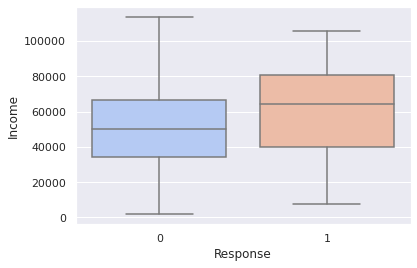

In [56]:
sns.boxplot(x="Response", y="Income", data=df, palette="coolwarm",showfliers=False)

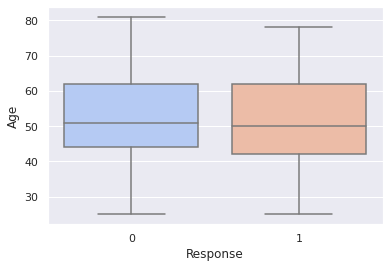

In [57]:
sns.boxplot(x="Response", y="Age", data=df, palette="coolwarm",showfliers=False)

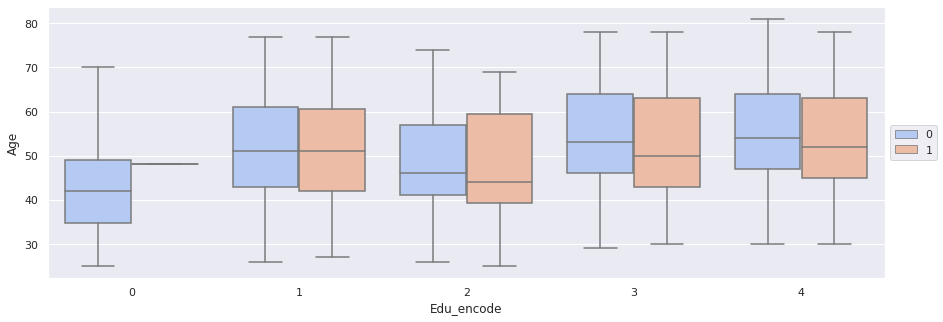

In [58]:
plt.figure(figsize=(15, 5))
sns.boxplot(x="Edu_encode", y="Age", hue="Response", data=df, palette="coolwarm",showfliers=False)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

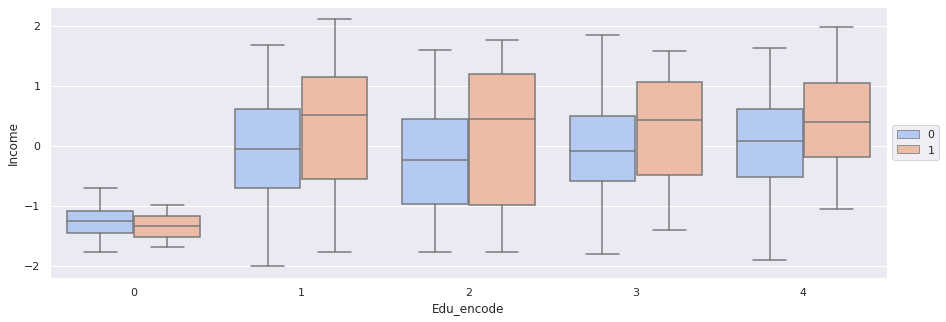

In [59]:
plt.figure(figsize=(15, 5))
sns.boxplot(x="Edu_encode", y="Income", hue="Response", data=get_scaler_standar(df,['Income']), palette="coolwarm",showfliers=False)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

<Figure size 1080x360 with 0 Axes>

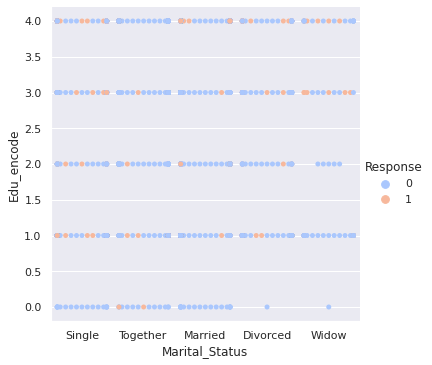

In [60]:
plt.figure(figsize=(15, 5))
sns.catplot(y="Edu_encode", x="Marital_Status", hue='Response', data=df, palette="coolwarm", kind="swarm")
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

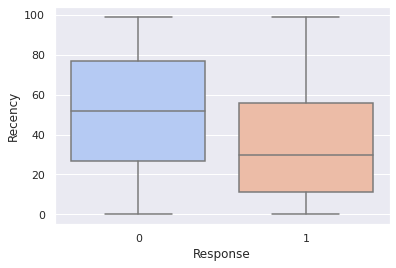

In [61]:
sns.boxplot(x="Response", y="Recency", data=df, palette="coolwarm",showfliers=False)

In [62]:
df['intercept']=1
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Age_range,Edu_encode,intercept
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,64,60 - 65,1,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,67,65 - 70,1,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,56,55 - 60,1,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,37,35 - 40,1,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,40,40 - 45,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,54,50 - 55,1,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,75,75 >,4,1
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,40,40 - 45,1,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,65,65 - 70,3,1


In [ ]:
# Recordemos nuesta variable dependiente y nuestras variables independientes
# (se debe excuir 'r78')
var_dep = ['Response']
var_ind = ['intercept','Age	', 'Income', 'Recency', 'hispan', 'married', 'nodegree','re74', 're75']

In [ ]:
import numpy as np
import scipy
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pylab

In [ ]:
# A partir de las variables descritas implementamos nuestro modelo de regresión
# Para ello emplearemos ahora smf.logit
# (Nota: bajo esta notación no se debe inclur el intercepto sino aparece 2 veces)
formula = 'Response ~ Age	+ Income + Recency + C(Edu_encode) + C(Marital_Status)'
logit_model = smf.logit(formula=formula, data=df).fit()
print(logit_model.summary())

Optimization terminated successfully.
         Current function value: 0.375744
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:               Response   No. Observations:                 2209
Model:                          Logit   Df Residuals:                     2197
Method:                           MLE   Df Model:                           11
Date:                Tue, 16 Mar 2021   Pseudo R-squ.:                  0.1089
Time:                        03:08:56   Log-Likelihood:                -830.02
converged:                       True   LL-Null:                       -931.42
Covariance Type:            nonrobust   LLR p-value:                 1.951e-37
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                        -1.7250      0.792     -2.177      0.

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode,intercept
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65,1,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70,1,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60,1,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40,1,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55,1,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >,4,1
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45,1,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70,3,1


In [ ]:
def get_scaler_standar(df,columns):
    df_scaled=df.copy()
    std_scaler = StandardScaler()
    array_scaled=std_scaler.fit_transform(df[columns])
    df_scaled_columns = pd.DataFrame(data=array_scaled, columns=df[columns].columns, index=df[columns].index)
    df_scaled[columns]=df_scaled_columns
    return df_scaled

In [ ]:
df = get_scaler_standar(df,['Income', 'Recency', 'Age', 'Edu_encode', 'Complain', 'Kidhome', 'Teenhome'])

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode,intercept
0,5524,1957,Graduation,Single,0.233957,-0.825110,-0.929287,2012-09-04,0.304866,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,-0.097435,3,11,1,0.984495,60 - 65,-0.819066,1
1,2174,1954,Graduation,Single,-0.234193,1.032219,0.907083,2014-03-08,-0.385846,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,-0.097435,3,11,0,1.234984,65 - 70,-0.819066,1
2,4141,1965,Graduation,Together,0.768833,-0.825110,-0.929287,2013-08-21,-0.800273,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,-0.097435,3,11,0,0.316523,55 - 60,-0.819066,1
3,6182,1984,Graduation,Together,-1.016084,1.032219,-0.929287,2014-02-10,-0.800273,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,-0.097435,3,11,0,-1.269908,35 - 40,-0.819066,1
4,5324,1981,PhD,Married,0.240109,1.032219,-0.929287,2014-01-19,1.548148,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,-0.097435,3,11,0,-1.019419,40 - 45,1.531800,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,0.356413,-0.825110,0.907083,2013-06-13,-0.109561,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,-0.097435,3,11,0,0.149531,50 - 55,-0.819066,1
2236,4001,1946,PhD,Together,0.467198,2.889547,0.907083,2014-06-10,0.235795,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,-0.097435,3,11,0,1.902955,75 >,1.531800,1
2237,7270,1981,Graduation,Divorced,0.188031,-0.825110,-0.929287,2014-01-25,1.444541,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,-0.097435,3,11,0,-1.019419,40 - 45,-0.819066,1
2238,8235,1956,Master,Together,0.674837,-0.825110,0.907083,2014-01-24,-1.421914,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,-0.097435,3,11,0,1.067991,65 - 70,0.748178,1


In [ ]:
df.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
Age                    0
Age_range              0
Edu_encode             0
intercept              0
dtype: int64

In [ ]:
df.dropna(inplace=True )

In [ ]:
2233-24

2209

In [ ]:
# A partir de las variables descritas implementamos nuestro modelo de regresión
# Para ello emplearemos ahora smf.logit
# (Nota: bajo esta notación no se debe inclur el intercepto sino aparece 2 veces)
formula = 'Response ~ Age	+ Income + Recency + C(Edu_encode) + C(Marital_Status)+Complain+ Kidhome+ C(Teenhome)'
logit_model = smf.logit(formula=formula, data=df).fit()
print(logit_model.summary())

Optimization terminated successfully.
         Current function value: 0.361179
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:               Response   No. Observations:                 2209
Model:                          Logit   Df Residuals:                     2193
Method:                           MLE   Df Model:                           15
Date:                Tue, 16 Mar 2021   Pseudo R-squ.:                  0.1434
Time:                        03:54:26   Log-Likelihood:                -797.85
converged:                       True   LL-Null:                       -931.42
Covariance Type:            nonrobust   LLR p-value:                 3.597e-48
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -2.3935      

In [ ]:
# A partir del modelo ya entrenado en el numeral anterior, 
# predecimos la probabilidad pscore_logit
pscore_logit = logit_model.predict()

In [ ]:
df[['Age', 'Income', 'Recency', 'Edu_encode', 'Marital_Status', 'Complain','Kidhome','Teenhome']].iloc[0]

Age                0.984495
Income             0.233957
Recency            0.304866
Edu_encode        -0.819066
Marital_Status       Single
Complain         -0.0974355
Kidhome            -0.82511
Teenhome          -0.929287
Name: 0, dtype: object

In [ ]:
perro = logit_model.predict(df[['Age', 'Income', 'Recency', 'Edu_encode', 'Marital_Status', 'Complain','Kidhome','Teenhome']].iloc[0])

AttributeError: ignored

In [ ]:
#Corroboramos que la cantidad de valores predichos corresponda
# con la longitud del set de entrenamiento (debe ser 614)
len(pscore_logit)

2209

In [ ]:
df['predicho']=pscore_logit

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode,intercept,predicho
0,5524,1957,Graduation,Single,0.233957,-0.825110,-0.929287,2012-09-04,0.304866,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,-0.097435,3,11,1,0.984495,60 - 65,-0.819066,1,0.237780
1,2174,1954,Graduation,Single,-0.234193,1.032219,0.907083,2014-03-08,-0.385846,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,-0.097435,3,11,0,1.234984,65 - 70,-0.819066,1,0.105622
2,4141,1965,Graduation,Together,0.768833,-0.825110,-0.929287,2013-08-21,-0.800273,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,-0.097435,3,11,0,0.316523,55 - 60,-0.819066,1,0.234716
3,6182,1984,Graduation,Together,-1.016084,1.032219,-0.929287,2014-02-10,-0.800273,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,-0.097435,3,11,0,-1.269908,35 - 40,-0.819066,1,0.133609
4,5324,1981,PhD,Married,0.240109,1.032219,-0.929287,2014-01-19,1.548148,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,-0.097435,3,11,0,-1.019419,40 - 45,1.531800,1,0.083546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,0.356413,-0.825110,0.907083,2013-06-13,-0.109561,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,-0.097435,3,11,0,0.149531,50 - 55,-0.819066,1,0.055774
2236,4001,1946,PhD,Together,0.467198,2.889547,0.907083,2014-06-10,0.235795,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,-0.097435,3,11,0,1.902955,75 >,1.531800,1,0.056086
2237,7270,1981,Graduation,Divorced,0.188031,-0.825110,-0.929287,2014-01-25,1.444541,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,-0.097435,3,11,0,-1.019419,40 - 45,-0.819066,1,0.134824
2238,8235,1956,Master,Together,0.674837,-0.825110,0.907083,2014-01-24,-1.421914,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,-0.097435,3,11,0,1.067991,65 - 70,0.748178,1,0.142454


In [ ]:
df[['Response', 'predicho']]

,Response,predicho
0,1,0.237780
1,0,0.105622
2,0,0.234716
3,0,0.133609
4,0,0.083546
...,...,...
2235,0,0.055774
2236,0,0.056086
2237,0,0.134824
2238,0,0.142454


In [ ]:
df['predicho_red']=df.predicho.apply(lambda x:  1 if x>=0.5 else 0 )

In [ ]:
df[['Response', 'predicho', 'predicho_red']].head(50)

,Response,predicho,predicho_red
0,1,0.237780,0
1,0,0.105622,0
2,0,0.234716,0
3,0,0.133609,0
4,0,0.083546,0
5,0,0.114024,0
6,0,0.152770,0
7,0,0.216407,0
8,1,0.251307,0
9,0,0.025513,0


In [89]:
from sklearn.metrics import roc_curve, auc

In [87]:
roc_logistic = roc_curve(df.Response,df.predicho)

NameError: ignored

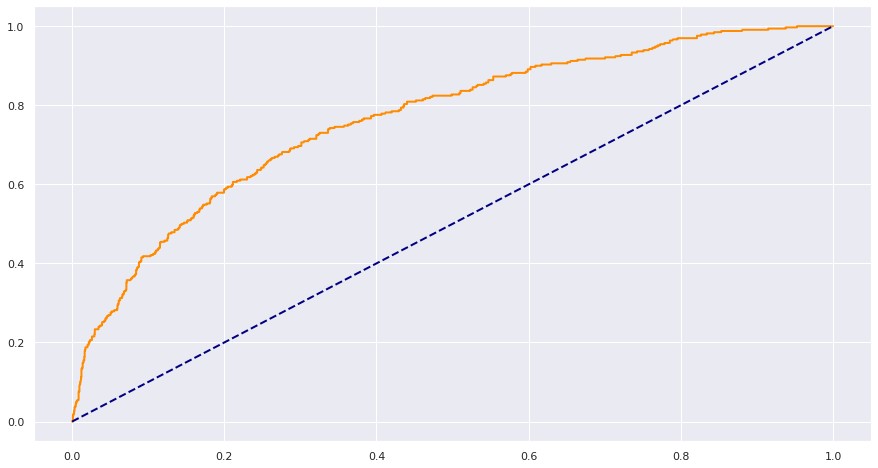

In [ ]:
# Graficamos las curvas ROC para cada uno de los modelos
plt.figure(figsize=(15,8))
line_width = 2
plt.plot(roc_logistic[0], roc_logistic[1], color='darkorange',
         lw=line_width, label=f'roc_logistic')
plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')

In [ ]:
auc_logistic =  auc(roc_logistic[0], roc_logistic[1] )

In [ ]:
auc_logistic

0.764900737013563

In [64]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Age_range,Edu_encode,intercept
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,64,60 - 65,1,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,67,65 - 70,1,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,56,55 - 60,1,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,37,35 - 40,1,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,40,40 - 45,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,54,50 - 55,1,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,75,75 >,4,1
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,40,40 - 45,1,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,65,65 - 70,3,1


In [75]:
df.dropna(inplace=True)

In [105]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Age_range,Edu_encode,intercept
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,64,60 - 65,1,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,67,65 - 70,1,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,56,55 - 60,1,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,37,35 - 40,1,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,40,40 - 45,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,54,50 - 55,1,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,75,75 >,4,1
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,40,40 - 45,1,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,65,65 - 70,3,1


In [124]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Age_range',
       'Edu_encode', 'intercept'],
      dtype='object')

In [106]:
target = 'Response'
predictors = ['Income', 'Age', 'Edu_encode', 'Complain']

In [107]:
RFC_METRIC = 'gini'  #metric used for RandomForrestClassifier
NUM_ESTIMATORS = 100 #number of estimators used for RandomForrestClassifier
NO_JOBS = 4 #number of parallel jobs used for RandomForrestClassifier


#TRAIN/VALIDATION/TEST SPLIT
#VALIDATION
VALID_SIZE = 0.20 # simple validation using train_test_split
TEST_SIZE = 0.20 # test size using_train_test_split

#CROSS-VALIDATION
NUMBER_KFOLDS = 5 #number of KFolds for cross-validation



RANDOM_STATE = 2018

MAX_ROUNDS = 1000 #lgb iterations
EARLY_STOP = 50 #lgb early stop 
OPT_ROUNDS = 1000  #To be adjusted based on best validation rounds
VERBOSE_EVAL = 50 #Print out metric result

In [108]:
train_df, test_df = train_test_split(df, test_size=TEST_SIZE, random_state=RANDOM_STATE, shuffle=True )
train_df, valid_df = train_test_split(train_df, test_size=VALID_SIZE, random_state=RANDOM_STATE, shuffle=True )

In [109]:
clf = RandomForestClassifier(n_jobs=NO_JOBS, 
                             random_state=RANDOM_STATE,
                             criterion=RFC_METRIC,
                             n_estimators=NUM_ESTIMATORS,
                             verbose=False)

In [110]:
clf.fit(train_df[predictors], train_df[target].values)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=4,
                       oob_score=False, random_state=2018, verbose=False,
                       warm_start=False)

In [111]:
preds = clf.predict(valid_df[predictors])

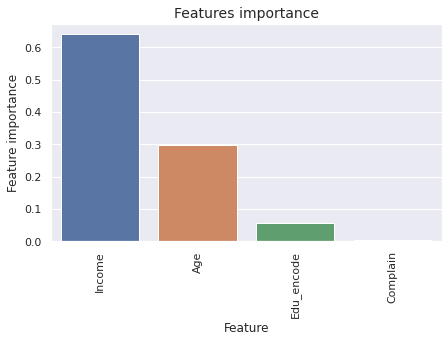

In [83]:
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': clf.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()

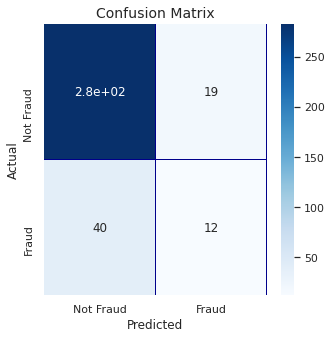

In [112]:
cm = pd.crosstab(valid_df[target].values, preds, rownames=['Actual'], colnames=['Predicted'])
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm, 
            xticklabels=['Not Fraud', 'Fraud'],
            yticklabels=['Not Fraud', 'Fraud'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Confusion Matrix', fontsize=14)
plt.show()

In [113]:
roc_auc_score(valid_df[target].values, preds)

0.5839276617422313

In [114]:
roc_logistic = roc_curve(df.Response,df.predicho)

AttributeError: ignored

In [115]:
roc_rf = roc_curve(valid_df[target].values, preds)

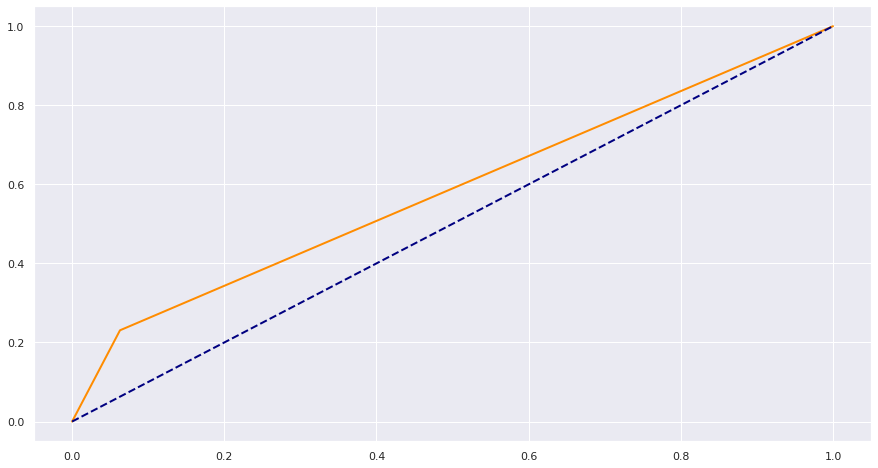

In [116]:
# Graficamos las curvas ROC para cada uno de los modelos
plt.figure(figsize=(15,8))
line_width = 2
plt.plot(roc_rf[0], roc_rf[1], color='darkorange',
         lw=line_width, label=f'roc_logistic')
plt.plot([0, 1], [0, 1], color='navy', lw=line_width, linestyle='--', label='Random guess')

In [122]:
# fit balanced xgboost on an imbalanced classification dataset
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost import XGBClassifier

In [118]:
# generate dataset
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
	n_clusters_per_class=2, weights=[0.99], flip_y=0, random_state=7)


In [121]:
y = 'Response'
X = ['Income', 'Age', 'Edu_encode', 'Complain']

In [123]:
# define model
model = XGBClassifier(scale_pos_weight=99)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model, df[X], df[y], scoring='roc_auc', cv=cv, n_jobs=-1)
# summarize performance
print('Mean ROC AUC: %.5f' % mean(scores))

Mean ROC AUC: 0.64385


# XGBoost

In [104]:
# Prepare the train and valid datasets
dtrain = xgb.DMatrix(train_df[predictors], train_df[target].values)
dvalid = xgb.DMatrix(valid_df[predictors], valid_df[target].values)
dtest = xgb.DMatrix(test_df[predictors], test_df[target].values)

#What to monitor (in this case, **train** and **valid**)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]

# Set xgboost parameters
params = {}
params['objective'] = 'binary:logistic'
params['eta'] = 0.039
params['silent'] = True
params['max_depth'] = 2
params['subsample'] = 0.8
params['colsample_bytree'] = 0.9
params['eval_metric'] = 'auc'
params['random_state'] = RANDOM_STATE

ValueError: ignored

In [93]:
model = xgb.train(params, 
                dtrain, 
                MAX_ROUNDS, 
                watchlist, 
                early_stopping_rounds=EARLY_STOP, 
                maximize=True, 
                verbose_eval=VERBOSE_EVAL)

[0]	train-auc:0.577187	valid-auc:0.516238
Multiple eval metrics have been passed: 'valid-auc' will be used for early stopping.

Will train until valid-auc hasn't improved in 50 rounds.
[50]	train-auc:0.705086	valid-auc:0.600866
Stopping. Best iteration:
[19]	train-auc:0.691739	valid-auc:0.637481



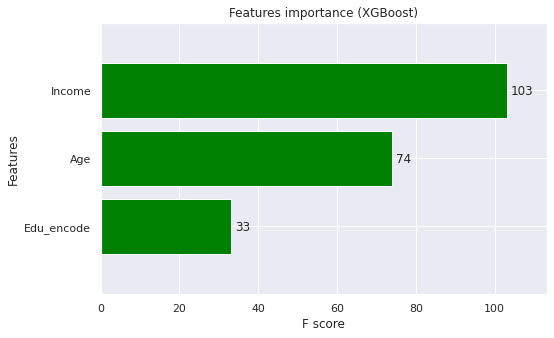

In [94]:
fig, (ax) = plt.subplots(ncols=1, figsize=(8,5))
xgb.plot_importance(model, height=0.8, title="Features importance (XGBoost)", ax=ax, color="green") 
plt.show()

In [95]:
preds = model.predict(dtest)

In [96]:
roc_auc_score(test_df[target].values, preds)

0.6734558293155157

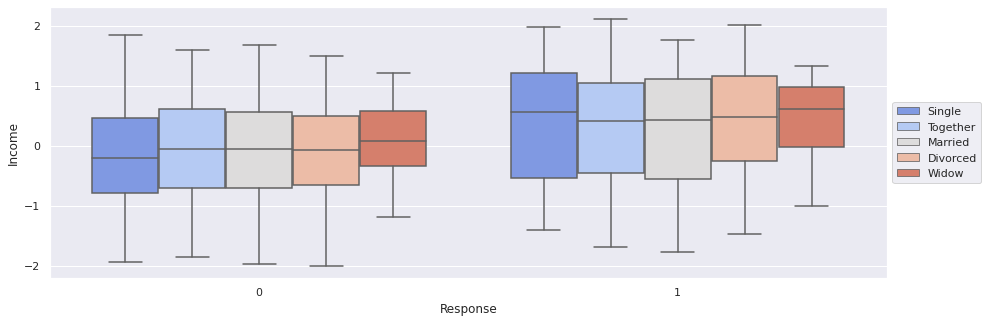

In [ ]:
plt.figure(figsize=(15, 5))
sns.boxplot(x="Response", y="Income", hue="Marital_Status", data=get_scaler_standar(df,['Income']), palette="coolwarm",showfliers=False)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [ ]:
df.groupby(['Marital_Status','Response']).count()['ID'].to_frame()

ID
Marital_Status Response     
Divorced       0         184
               1          48
Married        0         766
               1          98
Single         0         374
               1         106
Together       0         520
               1          60
Widow          0          58
               1          19

In [ ]:
sns.boxplot(x="Education", y="Income", hue='Response' data=df, palette="coolwarm",showfliers=False)

SyntaxError: ignored

In [ ]:
df.Dt_Customer = pd.to_datetime(df.Dt_Customer)

In [ ]:
df['Dt_Customer_num'] = df.Dt_Customer.map(datetime.datetime.toordinal)

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode,Dt_Customer_num
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65,1,734750
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70,1,735300
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60,1,735101
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40,1,735274
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45,4,735252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55,1,735032
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >,4,735394
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45,1,735258
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70,3,735257


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2233 entries, 0 to 2239
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2233 non-null   int64         
 1   Year_Birth           2233 non-null   int64         
 2   Education            2233 non-null   object        
 3   Marital_Status       2233 non-null   object        
 4   Income               2209 non-null   float64       
 5   Kidhome              2233 non-null   int64         
 6   Teenhome             2233 non-null   int64         
 7   Dt_Customer          2233 non-null   datetime64[ns]
 8   Recency              2233 non-null   int64         
 9   MntWines             2233 non-null   int64         
 10  MntFruits            2233 non-null   int64         
 11  MntMeatProducts      2233 non-null   int64         
 12  MntFishProducts      2233 non-null   int64         
 13  MntSweetProducts     2233 non-nul

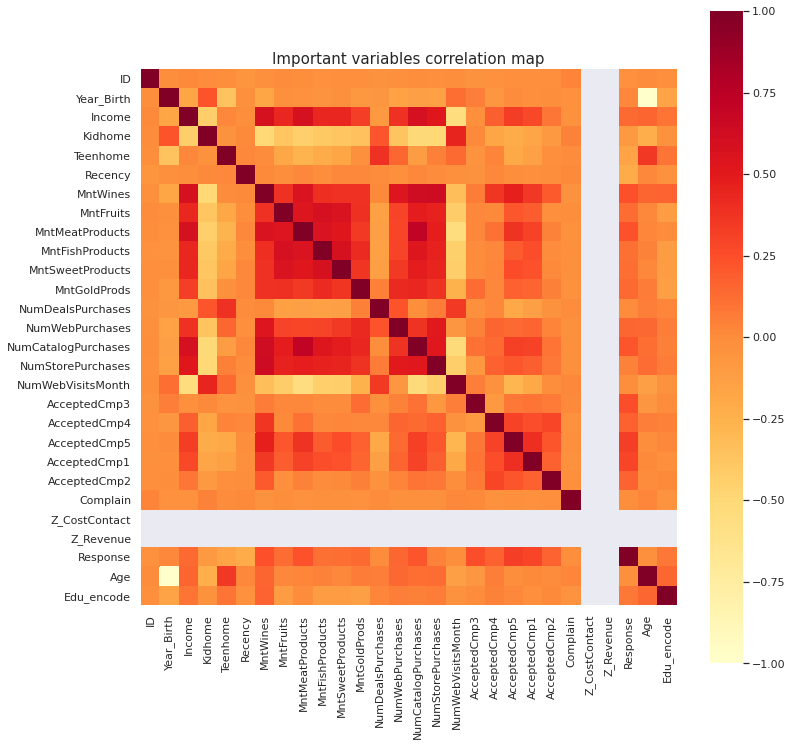

In [ ]:
corrmat = df.corr(method='pearson')
f, ax = plt.subplots(figsize=(12, 12))

# Draw the heatmap using seaborn
sns.heatmap(corrmat, vmax=1., square=True, cmap="YlOrRd")
plt.title("Important variables correlation map", fontsize=15)
plt.show()

Text(0.5, 1.0, 'Distribución de la variable surface_total')

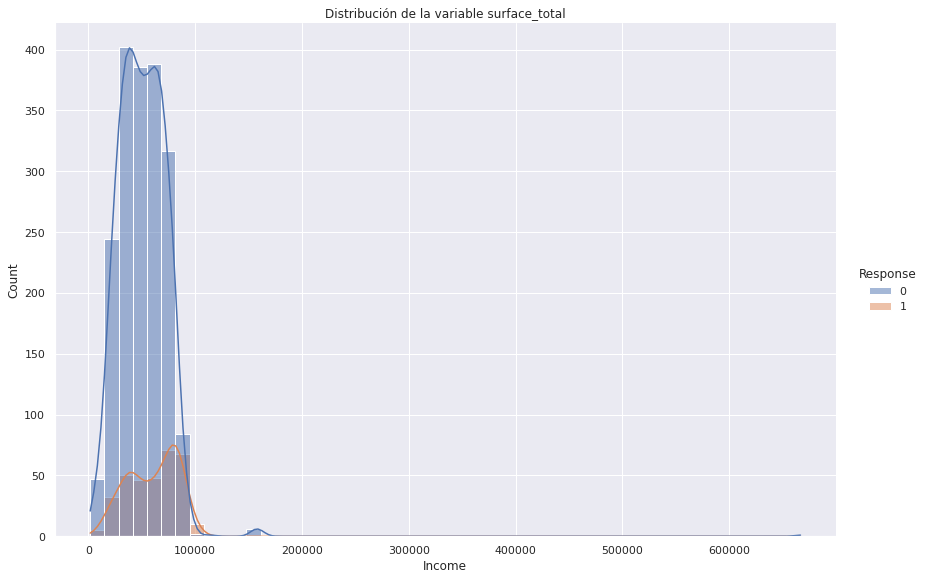

In [ ]:
# Nueva distribución que toma la variable surface_total tras el filtrado (Histograma)
sns.displot(data = df, x='Income', hue='Response', bins = 50, kde=True, height=8, aspect=1.5)
plt.title('Distribución de la variable surface_total')

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode,Dt_Customer_num
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65,1,734750
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70,1,735300
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60,1,735101
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40,1,735274
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45,4,735252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55,1,735032
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >,4,735394
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45,1,735258
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70,3,735257


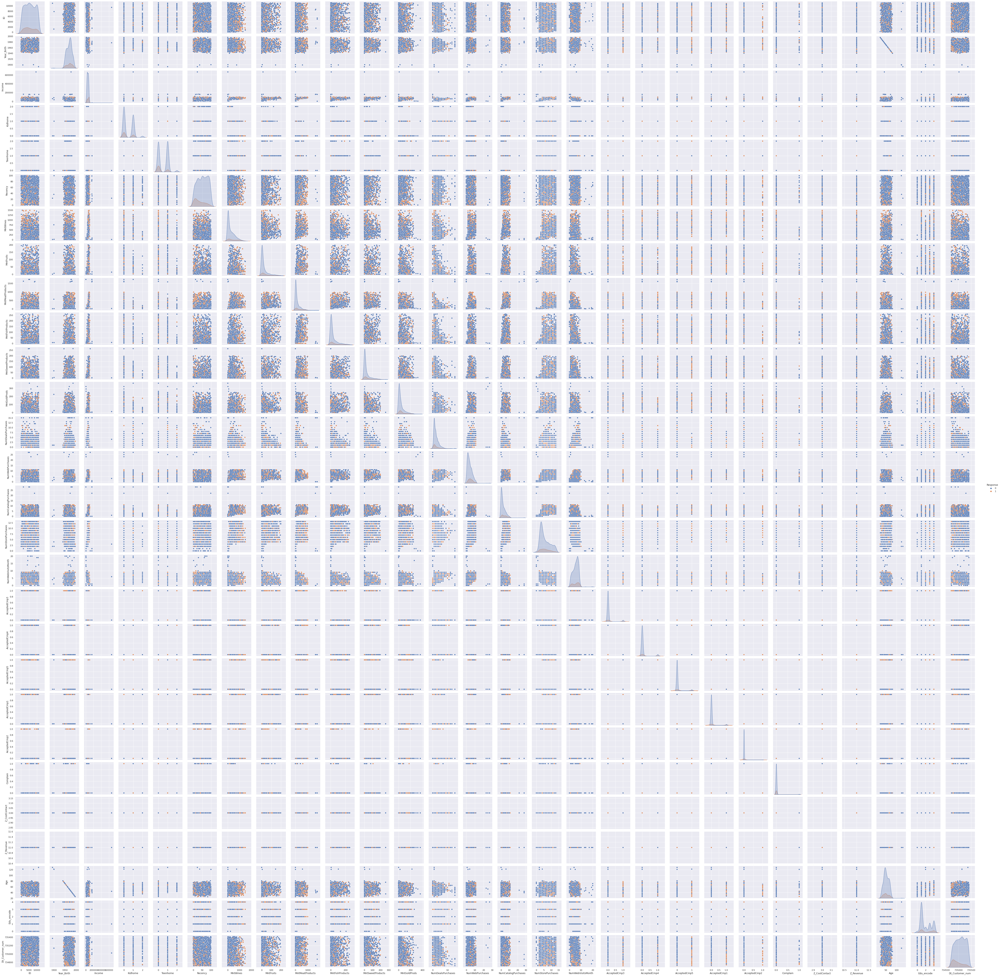

In [ ]:
sns.pairplot(df, hue = 'Response')

In [ ]:
cols_ = ['Age', 'Edu_encode']

# 4. Transformación de variables

### 4.1. Inclusión de la variable Age

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65


In [ ]:
df_analisis=df.groupby([df.Age_range])['ID'].count().to_frame().reset_index()
df_analisis

,Age_range,ID
0,< 30,28
1,30 - 35,119
2,35 - 40,199
3,40 - 45,260
4,45 - 50,394
5,50 - 55,330
6,55 - 60,255
7,60 - 65,232
8,65 - 70,241
9,70 - 75,139


In [ ]:
plt.figure(figsize=(15, 5))
sns.barplot(x="Age_range", 
            y="ID", 
            data=df_analisis,
            palette=colors_from_values(df_analisis['ID'], "coolwarm"))
#Formato de la gráfica
plt.title('% Cantidad total de pasos Vs periodo',fontsize=16)
plt.xlabel('% Cantidad total pasos', fontsize=15)
plt.ylabel('Periodo', fontsize=15)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tick_params(labelsize=14)
plt.show()

NameError: ignored

<Figure size 1080x360 with 0 Axes>

In [ ]:
dataset_analisis=df.groupby([df.Age_range, df.Education])['ID'].count().to_frame().reset_index()
dataset_analisis

,Age_range,Education,ID
0,< 30,2n Cycle,4
1,< 30,Basic,5
2,< 30,Graduation,17
3,< 30,Master,2
4,30 - 35,2n Cycle,16
5,30 - 35,Basic,8
6,30 - 35,Graduation,68
7,30 - 35,Master,12
8,30 - 35,PhD,15
9,35 - 40,2n Cycle,22


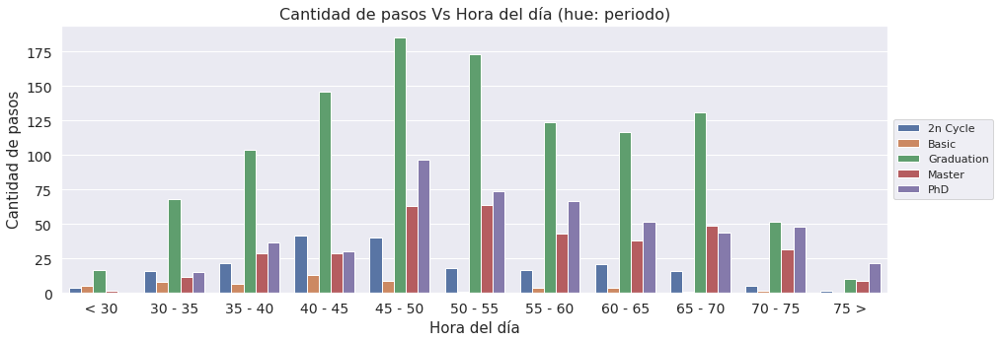

In [ ]:
plt.figure(figsize=(15, 5))
sns.barplot(x="Age_range", 
            y="ID", 
            hue='Education',
            data=dataset_analisis,
            #data=dataset_analisis[dataset_analisis.Education=='2n Cycle'],
            #palette=colors_from_values(dataset_analisis['cantidad_pasos'], "coolwarm")
            )
#Formato de la gráfica
plt.title('Cantidad de pasos Vs Hora del día (hue: periodo)',fontsize=16)
plt.xlabel('Hora del día', fontsize=15)
plt.ylabel('Cantidad de pasos', fontsize=15)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tick_params(labelsize=14)
plt.show()

In [ ]:
df[df.Education=='2n Cycle'].groupby([df.Age])['ID'].count().to_frame().reset_index()

,Age,ID
0,25,1
1,26,2
2,29,1
3,30,2
4,31,2
5,32,4
6,33,6
7,34,2
8,35,4
9,36,5


In [ ]:
dataset_analisis=df.groupby([df.Age_range, df.Edu_encode])['ID'].count().to_frame().reset_index()
dataset_analisis

,Age_range,Edu_encode,ID
0,< 30,0,5
1,< 30,1,17
2,< 30,2,4
3,< 30,3,2
4,30 - 35,0,8
5,30 - 35,1,68
6,30 - 35,2,16
7,30 - 35,3,12
8,30 - 35,4,15
9,35 - 40,0,7


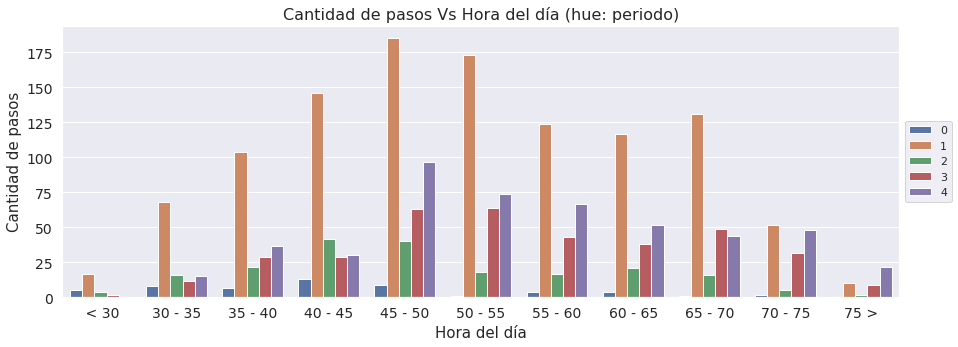

In [ ]:
plt.figure(figsize=(15, 5))
sns.barplot(x="Age_range", 
            y="ID", 
            hue='Edu_encode',
            data=dataset_analisis,
            #data=dataset_analisis[dataset_analisis.Education=='2n Cycle'],
            #palette=colors_from_values(dataset_analisis['cantidad_pasos'], "coolwarm")
            )
#Formato de la gráfica
plt.title('Cantidad de pasos Vs Hora del día (hue: periodo)',fontsize=16)
plt.xlabel('Hora del día', fontsize=15)
plt.ylabel('Cantidad de pasos', fontsize=15)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tick_params(labelsize=14)
plt.show()

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_range,Edu_encode
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,60 - 65,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,65 - 70,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,55 - 60,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,35 - 40,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,40 - 45,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,50 - 55,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,75 >,4
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,40 - 45,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,65 - 70,3


In [ ]:
# Función que me permite escalar empleando el StandarScaler
# Entradas: df (dataframe que quiero escalar, col (lista con las columnas que deseo escalar))
# Salida: dataframe escalado en las columnas que se pidio (mantiene indices de filas y columnas)
def get_scaler_standar(df,columns):
    df_scaled=df.copy()
    std_scaler = StandardScaler()
    array_scaled=std_scaler.fit_transform(df[columns])
    df_scaled_columns = pd.DataFrame(data=array_scaled, columns=df[columns].columns, index=df[columns].index)
    df_scaled[columns]=df_scaled_columns
    return df_scaled

In [ ]:
get_scaler_standar(df,columns)

In [ ]:
len(df.ID.unique())

2240

In [ ]:
df_analisis=df.groupby([df.Age])['ID'].count().to_frame().reset_index()
df_analisis

,Age,ID
0,25,2
1,26,5
2,27,3
3,28,5
4,29,13
5,30,15
6,31,18
7,32,30
8,33,29
9,34,27


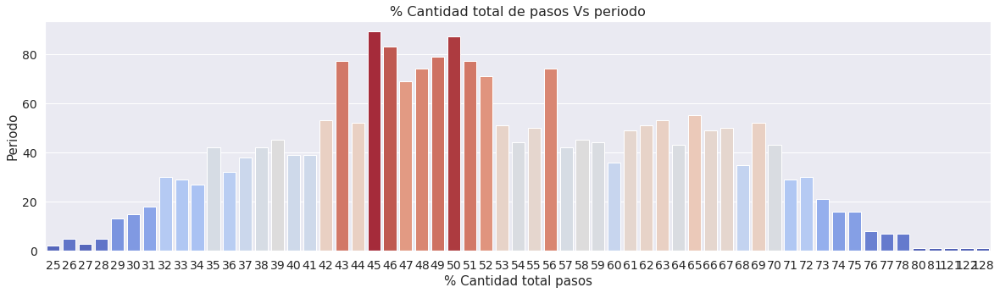

In [ ]:
plt.figure(figsize=(20, 5))
sns.barplot(x="Age", 
            y="ID",
            hue=
            data=df_analisis,
            palette=colors_from_values(df_analisis['ID'], "coolwarm"))
#Formato de la gráfica
plt.title('% Cantidad total de pasos Vs periodo',fontsize=16)
plt.xlabel('% Cantidad total pasos', fontsize=15)
plt.ylabel('Periodo', fontsize=15)
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tick_params(labelsize=14)
plt.show()

In [ ]:
df_analisis=df.groupby([df.Education])['ID'].count().to_frame().reset_index()
df_analisis

,Education,ID
0,2n Cycle,203
1,Basic,54
2,Graduation,1127
3,Master,370
4,PhD,486


In [ ]:
df_analisis.Education.unique()

array(['2n Cycle', 'Basic', 'Graduation', 'Master', 'PhD'], dtype=object)

In [ ]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Edu_encode
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,64,3
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,67,3
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,56,3
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,37,3
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,40,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0,54,3
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0,75,5
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0,40,3
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0,65,4


In [ ]:
print(df.columns)
len(df.columns)

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Age', 'Edu_encode'],
      dtype='object')


31

In [ ]:
cols_add = ['Age', 'Edu_encode']

cols_cost_info = ['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome','Teenhome', 'Dt_Customer']

cols_Mnt = ['MntFishProducts','MntFruits', 'MntMeatProducts', 'MntSweetProducts','MntWines','MntGoldProds']

cols_Num = ['NumCatalogPurchases','NumDealsPurchases', 'NumStorePurchases', 'NumWebPurchases',  'NumWebVisitsMonth']

cols_Acc = ['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']

cols_Others = ['Recency', 'Complain', 'Z_CostContact', 'Z_Revenue']
col_Target = ['Response']

In [ ]:
df[col_Target].value_counts()

Response
0           1906
1            334
dtype: int64

In [ ]:
df[cols_Others]

,Recency,Complain,Z_CostContact,Z_Revenue
0,58,0,3,11
1,38,0,3,11
2,26,0,3,11
3,26,0,3,11
4,94,0,3,11
...,...,...,...,...
2235,46,0,3,11
2236,56,0,3,11
2237,91,0,3,11
2238,8,0,3,11


In [ ]:
df.Z_CostContact.value_counts()

3    2240
Name: Z_CostContact, dtype: int64

In [ ]:
df.Z_Revenue.value_counts()

11    2240
Name: Z_Revenue, dtype: int64

In [ ]:
df.Complain.value_counts()

0    2219
1      21
Name: Complain, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [ ]:
# Hacemos la conversión de la columna fecha a tipo datetime
df.Dt_Customer = pd.to_datetime(df.Dt_Customer)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

In [ ]:
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [126]:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Age_range,Edu_encode,intercept
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,64,60 - 65,1,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,67,65 - 70,1,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,56,55 - 60,1,1
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,37,35 - 40,1,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,40,40 - 45,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,54,50 - 55,1,1
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,75,75 >,4,1
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,40,40 - 45,1,1
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,65,65 - 70,3,1


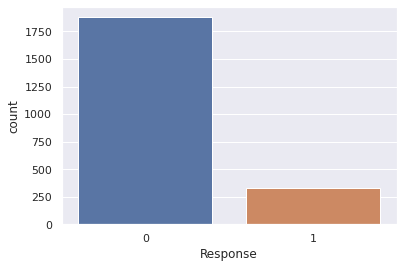

In [127]:
import seaborn as sns 
ax = sns.countplot(x='Response', data=df)

In [125]:
import imblearn

In [128]:
from imblearn.under_sampling import NearMiss

In [136]:
df_01=df.copy()

In [137]:
df_01=df_01[['Income', 'Recency', 'MntWines', 'Response']]
df_01

,Income,Recency,MntWines,Response
0,58138.0,58,635,1
1,46344.0,38,11,0
2,71613.0,26,426,0
3,26646.0,26,11,0
4,58293.0,94,173,0
...,...,...,...,...
2235,61223.0,46,709,0
2236,64014.0,56,406,0
2237,56981.0,91,908,0
2238,69245.0,8,428,0


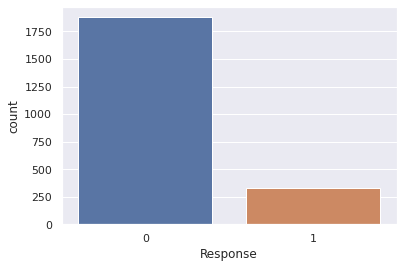

In [142]:
import seaborn as sns 
ax = sns.countplot(x='Response', data=df_01)

In [138]:
nr=NearMiss()

In [139]:
X= df_01.drop('Response', axis=1)
X

,Income,Recency,MntWines
0,58138.0,58,635
1,46344.0,38,11
2,71613.0,26,426
3,26646.0,26,11
4,58293.0,94,173
...,...,...,...
2235,61223.0,46,709
2236,64014.0,56,406
2237,56981.0,91,908
2238,69245.0,8,428


In [140]:
y= df_01.Response

In [141]:
X, y = nr.fit_sample(X,y)

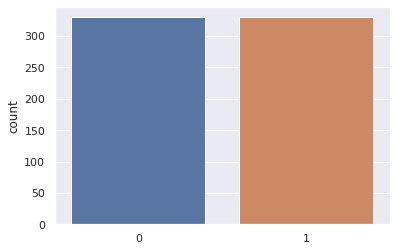

In [143]:
import seaborn as sns 
ax = sns.countplot(x=y)

In [150]:
X.shape

(660, 3)

In [151]:
y.size

660

In [152]:
print(clasification_report(y_test, y_pred))

NameError: ignored